# readme
descrip: plot figure (1) depth profile of AMOC at 26.5 from HR, LR, and RAPID obs <br> 
$\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;$              figure (2) time series of AMOC index from HR and LR at 26.5N, RAPID obs, and at 40N <br>
              
update history: <br>
v1.0 DL 2021Dec23 make AMOC depth profile and time series for reviewer #1 and #2 comments <br>

extra notes: <br>

# import modules

In [1]:
# general python packages
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import proplot as plot
# import cartopy
# import cartopy.crs as ccrs
# cartopy.config['pre_existing_data_dir']='/ihesp/shared/cartopy_features'
# from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# python GCM(POP) packages
# import xgcm
# import pop_tools
# import xoak
# import xesmf as xe

# dask jupyter lab packages
from dask.distributed import Client
# from dask.distributed import performance_report

# file name with time packages
# from itertools import product
# from cftime import DatetimeNoLeap

# incorporate dask 

In [2]:
# client = Client("tcp://10.73.3.129:36327")
# client

# define parameters

In [3]:
chunks_HR = {'nlat':400,'nlon':300}
chunks_LR = {'nlat':384,'nlon':320}

# === AMOC files ===
indir = '/ihesp/archive/Sunway_Runs/'
# --- TH (transient HR), CH (control HR) ---
infile_MOC_CH=indir+'HR_PI_CTRL/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.MOC.002101.050112.nc'
infile_MOC_TH=indir+'HR_HF_TNST/B.E.13.BTRANS.ne120_t12.sehires38.003.sunway.pop.h.MOC.185001.210012.nc'
# infile_MHT_HR = '/ihesp/shared/HR_OMIP2-CMIP6/g.e20.G.TL319_t13.control.001.pop.h.012301-018312.N_HEAT.nc' # Meridional Heat Transport
# -----------------------------------------

# --- TL (transient LR), CL (control LR) ---
infile_MOC_TL=indir+'LR_HF_TNST/B.E.13.BTRANS.ne30g16.sehires38.003.sunway.pop.h.MOC.185001.210012.nc'
infile_MOC_CL=indir+'LR_PI_CTRL/B.E.13.B1850C5.ne30g16.sehires38.003.sunway.pop.h.MOC.000101.050012.nc'
# ------------------------------------------
# ==================

time_en = np.arange(1850,2100+1,1) # 1850-2100 entire time period

outdir='/scratch/user/dapengli/Projects4iHESP/Project_SeaLevelUSEastCoast_2021Mar30/pics/'
pic1 = outdir + 'AMOC_CESM_RAPID4reviewer_depth_prof_2021Dec22.png'
pic2 = outdir + 'AMOC_CESM_RAPID4reviewer_time_series_2021Dec22.png'

# read data files

In [4]:
# read moc TL
ds_MOC_TL = xr.open_dataset(infile_MOC_TL) # , chunks={'moc_z':1}
time_s_TL = ds_MOC_TL.time.to_pandas().index.shift(-1,'M')  
ds_MOC_TL = ds_MOC_TL.assign_coords(time=time_s_TL)
ds_MOC_TL

<xarray.Dataset>
Dimensions:         (d2: 2, lat_aux_grid: 395, moc_comp: 3, moc_z: 61, time: 3012, transport_reg: 2)
Coordinates:
  * time            (time) object 1850-01-31 00:00:00 ... 2100-12-31 00:00:00
  * lat_aux_grid    (lat_aux_grid) float32 -79.49 -78.95 -78.42 ... 89.47 90.0
  * moc_z           (moc_z) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05 5.5e+05
Dimensions without coordinates: d2, moc_comp, transport_reg
Data variables:
    time_bound      (time, d2) object ...
    moc_components  (moc_comp) |S256 ...
    MOC             (time, transport_reg, moc_comp, moc_z, lat_aux_grid) float32 ...
Attributes:
    title:         B.E.13.BHISTC5.ne30g16.sehires38.003.sunway
    history:       none
    Conventions:   CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curren...
    contents:      Diagnostic and Prognostic Variables
    source:        CCSM POP2, the CCSM Ocean Component
    revision:      $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:      All years have exactly  365 days.
    start_time:    This dataset was created on 2020-04-11 at 22:22:40.9
    cell_methods:  cell_methods = time: mean ==> the variable values are aver...
    nsteps_total:  750
    tavg_sum:      2592000.0

In [5]:
ds_MOC_CL_raw = xr.open_dataset(infile_MOC_CL) # , chunks={'moc_z':1}
print('start time CL MOC:', ds_MOC_CL_raw.time[0].values)
print('end time CL MOC:', ds_MOC_CL_raw.time[-1].values)
# 250-->1850, 500-->2100
# 1-->1601, # 1850-(250-1)=1601
time_MOC_CL = xr.cftime_range(start="1601-01", end="2101-01", freq='M', calendar='noleap')
print('converted start time:', time_MOC_CL[0])
print('converted end time:', time_MOC_CL[-1])
ds_MOC_CL_raw2 = ds_MOC_CL_raw.assign_coords(time=time_MOC_CL)
ds_MOC_CL = ds_MOC_CL_raw2.sel(time=slice('1850','2100'))
ds_MOC_CL

start time CL MOC: 0001-02-01 00:00:00
end time CL MOC: 0501-01-01 00:00:00
converted start time: 1601-01-31 00:00:00
converted end time: 2100-12-31 00:00:00


<xarray.Dataset>
Dimensions:         (d2: 2, lat_aux_grid: 395, moc_comp: 3, moc_z: 61, nchar: 256, time: 3012, transport_reg: 2)
Coordinates:
  * time            (time) object 1850-01-31 00:00:00 ... 2100-12-31 00:00:00
  * lat_aux_grid    (lat_aux_grid) float32 -79.49 -78.95 -78.42 ... 89.47 90.0
  * moc_z           (moc_z) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05 5.5e+05
Dimensions without coordinates: d2, moc_comp, nchar, transport_reg
Data variables:
    time_bound      (time, d2) object ...
    moc_components  (moc_comp, nchar) |S1 ...
    MOC             (time, transport_reg, moc_comp, moc_z, lat_aux_grid) float32 ...
Attributes:
    title:           B.E.13.B1850C5.ne30g16.sehires38.003.sunway
    history:         none
    Conventions:     CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curr...
    contents:        Diagnostic and Prognostic Variables
    source:          CCSM POP2, the CCSM Ocean Component
    revision:        $Id: tavg.F90 56176 2013-12-20 18:35:46Z mlevy@ucar.edu $
    calendar:        All years have exactly  365 days.
    start_time:      This dataset was created on 2020-03-12 at 12:53:17.5
    cell_methods:    cell_methods = time: mean ==> the variable values are av...
    nsteps_total:    750
    tavg_sum:        2592000.0
    tavg_sum_qflux:  2592000.0

In [6]:
ds_MOC_TH = xr.open_dataset(infile_MOC_TH) # , chunks={'moc_z':1}
time_s_TH = ds_MOC_TH.time.to_pandas().index.shift(-1,'M') # shift 1 mon
ds_MOC_TH = ds_MOC_TH.assign_coords(time=time_s_TH)
ds_MOC_TH

<xarray.Dataset>
Dimensions:            (lat_aux_grid: 395, moc_comp: 1, moc_z: 63, time: 3012, transport_reg: 2)
Coordinates:
  * time               (time) object 1850-01-31 00:00:00 ... 2100-12-31 00:00:00
    transport_regions  (transport_reg) |S256 ...
    moc_components     (moc_comp) |S256 ...
  * moc_z              (moc_z) float32 0.0 1e+03 2e+03 ... 5.75e+05 6e+05
  * lat_aux_grid       (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
Dimensions without coordinates: moc_comp, transport_reg
Data variables:
    MOC                (time, transport_reg, moc_comp, moc_z, lat_aux_grid) float32 ...

In [7]:
ds_MOC_CH_raw = xr.open_dataset(infile_MOC_CH) # , chunks={'moc_z':1}
print('start time CH MOC:', ds_MOC_CH_raw.time[0].values)
print('end time CH MOC:', ds_MOC_CH_raw.time[-1].values)
# 250-->1850, 500-->2100
# 1-->1601, # 1850-(250-1)=1601
# 21-->1621,  501-->2101, 1850-(250-21)=1621
time_MOC_CH = xr.cftime_range(start="1621-01", end="2102-01", freq='M', calendar='noleap') 
ds_MOC_CH_raw1 = ds_MOC_CH_raw.assign_coords(time=time_MOC_CH)
ds_MOC_CH = ds_MOC_CH_raw1.sel(time=slice('1850','2100'))
ds_MOC_CH

start time CH MOC: 0021-02-01 00:00:00
end time CH MOC: 0502-01-01 00:00:00


<xarray.Dataset>
Dimensions:            (lat_aux_grid: 395, moc_comp: 1, moc_z: 63, time: 3012, transport_reg: 2)
Coordinates:
  * time               (time) object 1850-01-31 00:00:00 ... 2100-12-31 00:00:00
    transport_regions  (transport_reg) |S256 ...
    moc_components     (moc_comp) |S256 ...
  * moc_z              (moc_z) float32 0.0 1e+03 2e+03 ... 5.75e+05 6e+05
  * lat_aux_grid       (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
Dimensions without coordinates: moc_comp, transport_reg
Data variables:
    MOC                (time, transport_reg, moc_comp, moc_z, lat_aux_grid) float32 ...

In [8]:
# infile_t12 = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/POP_grids_2021Nov01/'
#               'POPgrids_tx0.1v2_2020Jun29.nc') # POP t12 grid file
# ds_t12 = xr.open_dataset(infile_t12)
# ds_t12

# infile_g16 = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/POP_grids_2021Nov01/'
#               'POPgrids_gx1v6_2020Jun29.nc') # POP g16 grid file
# ds_g16 = xr.open_dataset(infile_g16)
# ds_g16

# infile0_HR = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/HistoryFilesPOP/'
#               'B.E.13.BHISTC5.ne120_t12.sehires38.003.sunway.pop.h.1850-01.nc')
# ds0_HR = xr.open_dataset(infile0_HR)
# ds0_HR

# infile0_LR = ('/ihesp/user/dapengli/Projects4iHESP/SupplementaryFiles4POP/HistoryFilesPOP/'
#               'cmpr_B.E.13.BHISTC5.ne30g16.sehires38.003.sunway.pop.h.1850-01.nc')
# ds0_LR = xr.open_dataset(infile0_LR)
# ds0_LR

In [9]:
# read obs amoc
infile_moc_z_obs = '/ihesp/user/dapengli/obs_dat/RAPID_AMOC_26.5N_2021Dec10/moc_vertical.nc'
ds_moc_z_obs = xr.open_dataset(infile_moc_z_obs)
ds_moc_z_obs

<xarray.Dataset>
Dimensions:              (depth: 307, time: 11641)
Coordinates:
  * time                 (time) datetime64[ns] 2004-04-02 ... 2020-03-09
  * depth                (depth) float64 0.0 19.87 39.74 ... 5.976e+03 5.995e+03
Data variables:
    stream_function_mar  (depth, time) float64 ...
Attributes:
    Title:                         RAPID streamfunction
    Institution:                   National Oceanography Centre,UK
    Website:                       http://www.rapid.ac.uk/rapidmoc
    Acknowledgement:               The RAPID 26N AMOC monitoring project is f...
    Created_by:                    Ben Moat
    Creation_date:                 17-Sep-2021
    Principle_investigator:        Eleanor Frajka-Williams
    Principle_investigator_email:  eleanor.frajka@noc.ac.uk
    DOI:                           doi:10.5285/cc1e34b3-3385-662b-e053-6c86ab...

In [10]:
# infile_moc_t_obs = '/ihesp/user/dapengli/obs_dat/RAPID_AMOC_26.5N_2021Dec10/moc_transports.nc'
# ds_moc_t_obs = xr.open_dataset(infile_moc_t_obs)
# ds_moc_t_obs

# Data analysis

raw moc obs start time: 2004-04-02T00:00:00.000000000
raw moc obs end time:  2020-03-09T00:00:00.000000000
('depth',)
select moc obs start time: 2005-01-01T00:00:00.000000000
select moc obs end time:  2019-12-31T12:00:00.000000000
('time',)


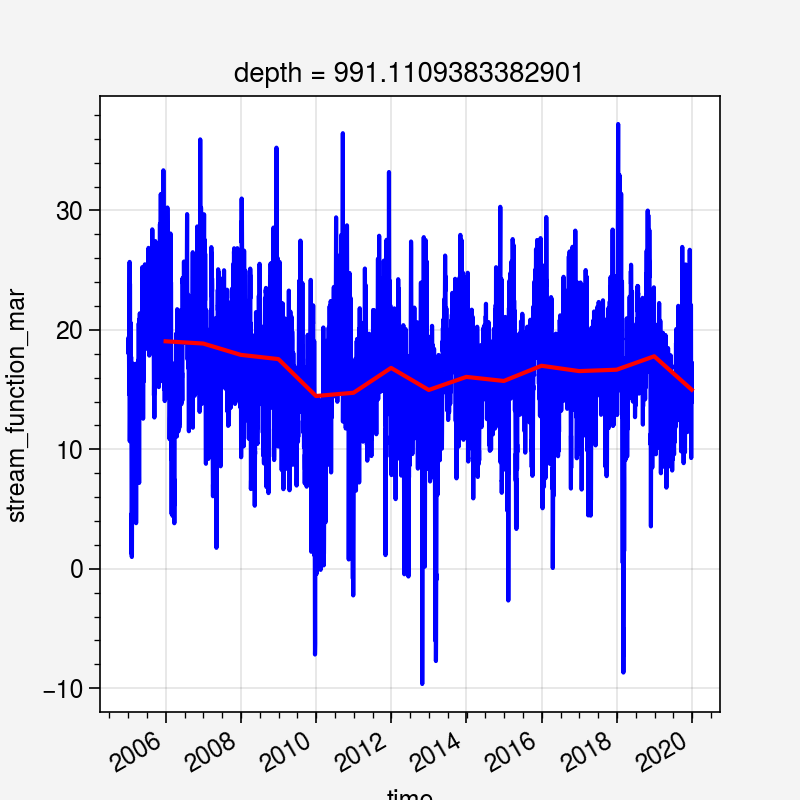

In [11]:
# compute obs amoc 
print('raw moc obs start time:', ds_moc_z_obs.time[0].values)
print('raw moc obs end time: ', ds_moc_z_obs.time[-1].values)
amoc_tav_obs = ds_moc_z_obs.stream_function_mar.mean('time') #  time mean to get vertical prof plot
# amoc_tav_obs.plot()
print(amoc_tav_obs.dims)

amoc_obs = ds_moc_z_obs.stream_function_mar.sel(time=slice('2005', '2019'))
print('select moc obs start time:', amoc_obs.time[0].values)
print('select moc obs end time: ', amoc_obs.time[-1].values)
amoc_z1_ts_obs = amoc_obs.sel(depth=1000,method='nearest').resample(time='A').mean('time') # 2005-2019 yr time series
print(amoc_z1_ts_obs.dims)

amoc_obs.sel(depth=1000, method='nearest').plot(color='b')
amoc_z1_ts_obs.plot(color='r')

In [12]:
amoc_lat1_TL = ds_MOC_TL.MOC.sel(lat_aux_grid=26.5, method='nearest').sel(moc_comp=0, transport_reg=1)
amoc_lat1_TH = ds_MOC_TH.MOC.sel(lat_aux_grid=26.5, method='nearest').sel(moc_comp=0, transport_reg=1)
# amoc_lat1_CL = ds_MOC_CL.MOC.sel(lat_aux_grid=26.5, method='nearest').sel(moc_comp=0, transport_reg=1)
# amoc_lat1_CH = ds_MOC_CH.MOC.sel(lat_aux_grid=26.5, method='nearest').sel(moc_comp=0, transport_reg=1)
amoc_lat1_TH

amoc_lat2_TL = ds_MOC_TL.MOC.sel(lat_aux_grid=40, method='nearest').sel(moc_comp=0, transport_reg=1)
amoc_lat2_TH = ds_MOC_TH.MOC.sel(lat_aux_grid=40, method='nearest').sel(moc_comp=0, transport_reg=1)
amoc_lat2_CL = ds_MOC_CL.MOC.sel(lat_aux_grid=40, method='nearest').sel(moc_comp=0, transport_reg=1)
amoc_lat2_CH = ds_MOC_CH.MOC.sel(lat_aux_grid=40, method='nearest').sel(moc_comp=0, transport_reg=1)
# amoc_lat2_TH
print('amoc_lat2_TH dim:', amoc_lat2_TH.dims)
print('amoc_lat2_TH shape:', amoc_lat2_TH.shape)

amoc_lat2_TH dim: ('time', 'moc_z')
amoc_lat2_TH shape: (3012, 63)


In [13]:
# amoc_lat1_TL.sel(time=slice('2005','2019')).var('time').plot(color='b')
# amoc_lat1_TH.sel(time=slice('2005','2019')).var('time').plot(color='r')
# amoc_lat2_TL.sel(time=slice('2005','2019')).var('time').plot(color='b')
# amoc_lat2_TH.sel(time=slice('2005','2019')).var('time').plot(color='r')

In [14]:
# compute depth profile

# obs time, also used for LR and HR 
time1_str = '2004-04'
time2_str = '2020-03'

print('start time LR',amoc_lat1_TL.sel(time=slice(time1_str, time2_str)).time[0].values)
print('end time LR',amoc_lat1_TL.sel(time=slice(time1_str, time2_str)).time[-1].values)

print('start time HR',amoc_lat1_TH.sel(time=slice(time1_str, time2_str)).time[0].values)
print('end time HR',amoc_lat1_TH.sel(time=slice(time1_str, time2_str)).time[-1].values)

amoc_lat1_tav_TL = amoc_lat1_TL.sel(time=slice(time1_str, time2_str)).mean('time')
amoc_lat1_tav_TH = amoc_lat1_TH.sel(time=slice(time1_str, time2_str)).mean('time')

amoc_lat2_tav_TL = amoc_lat2_TL.sel(time=slice(time1_str, time2_str)).mean('time')
amoc_lat2_tav_TH = amoc_lat2_TH.sel(time=slice(time1_str, time2_str)).mean('time')
# amoc_lat1_tav_TH.plot()
# amoc_lat1_tav_TH
print('amoc_lat1_tav_TH dim:', amoc_lat2_tav_TH.dims)
print('amoc_lat1_tav_TH shape:', amoc_lat1_tav_TH.shape)

start time LR 2004-04-30 00:00:00
end time LR 2020-03-31 00:00:00
start time HR 2004-04-30 00:00:00
end time HR 2020-03-31 00:00:00
amoc_lat1_tav_TH dim: ('moc_z',)
amoc_lat1_tav_TH shape: (63,)


In [15]:
# compute time series
amoc_lat1_z1_TH = amoc_lat1_TH.sel(moc_z=1000*100, method='nearest').resample(time='A').mean('time')
amoc_lat1_z1_TL = amoc_lat1_TL.sel(moc_z=1000*100, method='nearest').resample(time='A').mean('time')

amoc_lat2_z1_TH = amoc_lat2_TH.sel(moc_z=1000*100, method='nearest').resample(time='A').mean('time')
amoc_lat2_z1_TL = amoc_lat2_TL.sel(moc_z=1000*100, method='nearest').resample(time='A').mean('time')

amoc_lat2_z1_CH = amoc_lat2_CH.sel(moc_z=1000*100, method='nearest').resample(time='A').mean('time')
amoc_lat2_z1_CL = amoc_lat2_CL.sel(moc_z=1000*100, method='nearest').resample(time='A').mean('time')

amoc_lat2_z1_THmCH = amoc_lat2_z1_TH - amoc_lat2_z1_CH
amoc_lat2_z1_TLmCL = amoc_lat2_z1_TL - amoc_lat2_z1_CL

print('amoc_lat2_z1_TH dim:', amoc_lat2_z1_TH.dims)
print('amoc_lat2_z1_TH shape:', amoc_lat2_z1_TH.shape)

amoc_lat2_z1_TH dim: ('time',)
amoc_lat2_z1_TH shape: (251,)


# make pics

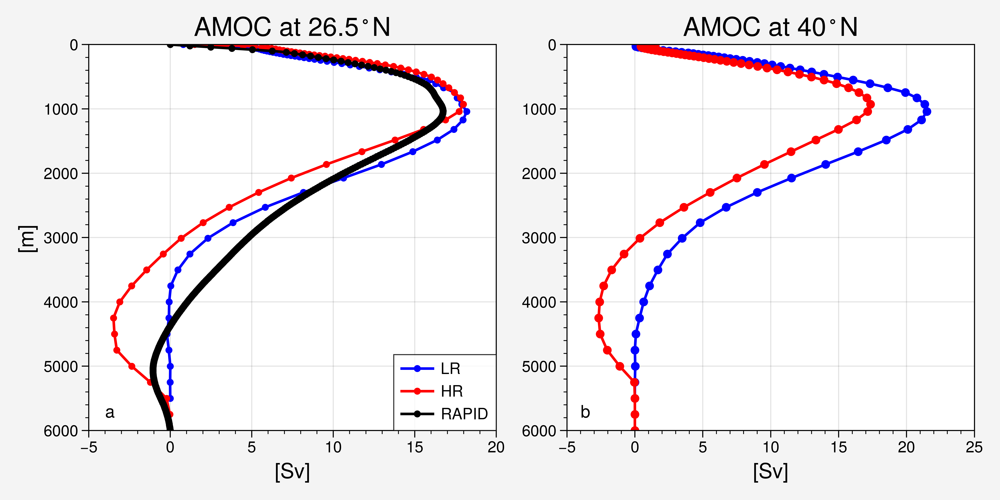

In [16]:
# depth prof
fig1, axs = plt.subplots(1,2,figsize=(8, 4),dpi=500)
# fig1, axs = plot.subplots(nrows=1,ncols=2,width='8in',height='4in',share=0)

axs[0].plot(amoc_lat1_tav_TL, amoc_lat1_tav_TL.moc_z/100, marker='o', color='b', markersize=3, label='LR')
axs[0].plot(amoc_lat1_tav_TH, amoc_lat1_tav_TH.moc_z/100, marker='o', color='r', markersize=3, label='HR')
axs[0].plot(amoc_tav_obs, amoc_tav_obs.depth, marker='o', color='k', markersize=3, label='RAPID')

axs[0].set_xlim([-5, 20])
axs[0].set_ylim([0, 6000])
axs[0].invert_yaxis()
axs[0].set_title(r'AMOC at 26.5$^\circ$N ', fontsize=15)
axs[0].set_ylabel('[m]', fontsize=12)
axs[0].set_xlabel('[Sv]', fontsize=12)
axs[0].legend(loc='lower right')
axs[0].text(-4, 5800, 'a', fontsize=10)

axs[1].plot(amoc_lat2_tav_TL, amoc_lat2_tav_TL.moc_z/100, marker='o', color='b', markersize=4, label='LR')
axs[1].plot(amoc_lat2_tav_TH, amoc_lat2_tav_TH.moc_z/100, marker='o', color='r', markersize=4, label='HR')
axs[1].set_xlim([-5, 25])
axs[1].set_ylim([0, 6000])
axs[1].invert_yaxis()
axs[1].set_title(r'AMOC at 40$^\circ$N ', fontsize=15)
axs[1].set_ylabel('', fontsize=12)
axs[1].set_xlabel('[Sv]', fontsize=12)
# axs[0].legend(loc='lr')
axs[1].text(-4, 5800, 'b', fontsize=10)

fig1.tight_layout()

fig1.savefig(pic1, bbox_inches='tight')

In [17]:
# time series plot 
fig2, axs = plt.subplots(2,2,figsize=(12, 8),dpi=500)
# fig, axs = plot.subplots(nrows=2, ncols=2, width='12in', height='8in',share=0)

yrs = np.arange(1850,2100+1,1)

# amoc at 26.5 N
axs[0,0].plot(yrs, amoc_lat1_z1_TL, color='b', linewidth=0.5)
axs[0,0].plot(yrs, amoc_lat1_z1_TL.rolling(time=10, center=True).mean(), color='b', linewidth=2, label="LR")
axs[0,0].plot(yrs, amoc_lat1_z1_TH, color='r', linewidth=0.5)
axs[0,0].plot(yrs, amoc_lat1_z1_TH.rolling(time=10, center=True).mean(), color='r', linewidth=2, label="HR")
axs[0,0].plot(np.arange(2005,2019+1,1), amoc_z1_ts_obs, color='k', linewidth=1, label='RAPID') # marker='o', markersize=2
axs[0,0].set_xlim([1850,2100])
axs[0,0].set_ylim([5, 27.5])
axs[0,0].set_ylabel('[Sv]', fontsize=15)
axs[0,0].set_title(r'AMOC at 26.5$^\circ$N (TNST)', fontsize=15)
# axs[0,0].grid()
axs[0,0].legend(loc="upper left", frameon=True)
axs[0,0].text(1855, 5.5, 'a', fontsize=12)
axs[0,0].tick_params(axis='both', which='major', labelsize=12)
axs[0,0].fill_between([2001,2100+1], [-10,-10], [40,40], 
                facecolor='r', alpha=0.1)


axs[0,1].plot(yrs, amoc_lat2_z1_TL, color='b', linewidth=0.5, label="TR LR")
axs[0,1].plot(yrs, amoc_lat2_z1_TL.rolling(time=10, center=True).mean(), color='b', linewidth=2, label="TR LR")
axs[0,1].plot(yrs, amoc_lat2_z1_TH, color='r', linewidth=0.5, label="TR HR")
axs[0,1].plot(yrs, amoc_lat2_z1_TH.rolling(time=10, center=True).mean(), color='r', linewidth=2, label="TR HR")
axs[0,1].set_xlim([1850,2100])
axs[0,1].set_ylim([5,27.5])
# axs[0,1].set_ylabel('[Sv]', fontsize=15)
axs[0,1].set_title(r'AMOC at 40$^\circ$N (TNST)', fontsize=15)
# axs[0,1].grid()
axs[0,1].text(1855, 5.5, 'b', fontsize=12)
axs[0,1].tick_params(axis='both', which='major', labelsize=12)
axs[0,1].fill_between([2001,2100+1], [5,5], [27.5,27.5], 
                facecolor='r', alpha=0.1)

axs[1,0].plot(yrs, amoc_lat2_z1_CL, color='b', linestyle='-', 
            linewidth=0.5, label="CN LR")
axs[1,0].plot(yrs, amoc_lat2_z1_CL.rolling(time=10, center=True).mean(), color='b', linestyle='-', 
            linewidth=2, label="CN LR")
axs[1,0].plot(yrs, amoc_lat2_z1_CH, color='r', linestyle='-', 
            linewidth=0.5, label="CN HR")
axs[1,0].plot(yrs, amoc_lat2_z1_CH.rolling(time=10, center=True).mean(), color='r', linestyle='-', 
            linewidth=2, label="CN HR")
axs[1,0].set_xlim([1850,2100])
axs[1,0].set_ylim([5,27.5])
axs[1,0].set_ylabel('[Sv]', fontsize=15)
axs[1,0].set_title(r'AMOC at 40$^\circ$N (CTRL)', fontsize=15)
# axs[1,0].grid()
axs[1,0].text(1855, 5.5, 'c', fontsize=12)
axs[1,0].tick_params(axis='both', which='major', labelsize=12)

axs[1,1].plot(yrs, amoc_lat2_z1_TLmCL, 
              color='b', linestyle='-', linewidth=0.5, label="CN LR")
axs[1,1].plot(yrs, amoc_lat2_z1_TLmCL.rolling(time=10, center=True).mean(), 
              color='b', linestyle='-', linewidth=2, label="CN LR")
axs[1,1].plot(yrs, amoc_lat2_z1_THmCH,  
              color='r', linestyle='-',linewidth=0.5, label="CN HR")
axs[1,1].plot(yrs, amoc_lat2_z1_THmCH.rolling(time=10, center=True).mean().values, 
              color='r', linestyle='-', linewidth=2, label="CN HR")
axs[1,1].set_xlim([1850,2100])
axs[1,1].set_ylim([-15,7.5])
# axs[1,1].set_ylabel('', fontsize=15)
axs[1,1].set_title(r'AMOC at 40$^\circ$N (TNST - CTRL)', fontsize=15)
# axs[1,1].grid()
axs[1,1].text(1855, -14.5, 'd', fontsize=12)
axs[1,1].tick_params(axis='both', which='major', labelsize=12)
axs[1,1].fill_between([2001,2100+1], [-15,-15], [7.5,7.5], 
                facecolor='r', alpha=0.1)

fig2.tight_layout()

l, b, h, w = .1, .57, .15, .2
axs2 = fig2.add_axes([l, b, w, h])
axs2.plot(np.arange(2005,2019+1,1), amoc_lat1_z1_TH.sel(time=slice('2005', '2019')), color='r', marker='o', markersize=3)
axs2.plot(np.arange(2005,2019+1,1), amoc_lat1_z1_TL.sel(time=slice('2005', '2019')), color='b', marker='o', markersize=3)
axs2.plot(np.arange(2005,2019+1,1), amoc_z1_ts_obs, color='k', marker='o', markersize=3)
axs2.set_xticks(np.arange(2005,2021,5))
axs2.set_ylim(14, 20)
axs2.set_yticks(np.arange(14,21,2))
axs2.set_ylabel('[Sv]', fontsize=8)

fig2.savefig(pic2,bbox_inches='tight')

# Appendix

In [ ]:
# depth prof
fig1, axs = plt.subplots(1,2,figsize=(12, ),dpi=500)
# fig, axs = plot.subplots(nrows=3, ncols=2, width='12in', height='10in')

yrs = np.arange(1850,2100+1,1)

# column 1: global av. steric height and SSH
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_fn_TH, color='r', 
#          linewidth=2, label='TR HR')
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_CH, color='r', linestyle='dashed', 
#          linewidth=2, label='CN HR')
axs[0,0].plot(np.arange(1850,2100+1,1), (h_rst_gl_a_TH-h_rst_gl_a_CH), 
         color='r', linewidth=2, label='HR')
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_intp_TL, color='c', 
#          linewidth=2, label='TR LR')
# axs[0,0].plot(np.arange(1850,2100+1,1), h_rst_gl_a_intp_CL, color='c', 
#          linewidth=2, linestyle='dashed',label='CN LR')
axs[0,0].plot(np.arange(1850,2100+1,1), (h_rst_gl_a_TL-h_rst_gl_a_CL), 
         color='b', linewidth=2, label='LR')
axs[0,0].set_xlim([1850,2100])
axs[0,0].set_ylim([-10,40])
axs[0,0].set_ylabel('[cm]', fontsize=15)
axs[0,0].set_title('global mean steric height relative to 1850', fontsize=15)
axs[0,0].grid()
axs[0,0].legend(loc="upper left", frameon=True)
axs[0,0].text(1855, -9, 'a', fontsize=12)
axs[0,0].tick_params(axis='both', which='major', labelsize=12)
axs[0,0].fill_between([2001,2100+1], [-10,-10], [40,40], 
                facecolor='r', alpha=0.1)

axs[0,1].plot(yrs, MOC45_yr_TL, color='b', linewidth=0.5, label="TR LR")
axs[0,1].plot(yrs, MOC45_yr_TL.rolling(time=10, center=True).mean(), color='b', linewidth=2, label="TR LR")
axs[0,1].plot(yrs, MOC45_yr_TH, color='r', linewidth=0.5, label="TR HR")
axs[0,1].plot(yrs, MOC45_yr_TH.rolling(time=10, center=True).mean(), color='r', linewidth=2, label="TR HR")
axs[0,1].set_xlim([1850,2100])
axs[0,1].set_ylim([5,27.5])
axs[0,1].set_ylabel('[Sv]', fontsize=15)
axs[0,1].set_title('AMOC strength (TNST)', fontsize=15)
axs[0,1].grid()
axs[0,1].text(1855, 5.5, 'b', fontsize=12)
axs[0,1].tick_params(axis='both', which='major', labelsize=12)
axs[0,1].fill_between([2001,2100+1], [5,5], [27.5,27.5], 
                facecolor='r', alpha=0.1)

axs[1,0].plot(yrs, MOC45_yr_CL, color='b', linestyle='-', 
            linewidth=0.5, label="CN LR")
axs[1,0].plot(yrs, MOC45_yr_CL.rolling(time=10, center=True).mean(), color='b', linestyle='-', 
            linewidth=2, label="CN LR")
axs[1,0].plot(yrs, MOC45_yr_CH, color='r', linestyle='-', 
            linewidth=0.5, label="CN HR")
axs[1,0].plot(yrs, MOC45_yr_CH.rolling(time=10, center=True).mean(), color='r', linestyle='-', 
            linewidth=2, label="CN HR")
axs[1,0].set_xlim([1850,2100])
axs[1,0].set_ylim([5,27.5])
axs[1,0].set_ylabel('[Sv]', fontsize=15)
axs[1,0].set_title('AMOC strength (CTRL)', fontsize=15)
axs[1,0].grid()
axs[1,0].text(1855, 5.5, 'c', fontsize=12)
axs[1,0].tick_params(axis='both', which='major', labelsize=12)

MOC45_yr_TLmCL = MOC45_yr_TL - MOC45_yr_CL
MOC45_yr_THmCH = MOC45_yr_TH - MOC45_yr_CH
axs[1,1].plot(yrs, MOC45_yr_TLmCL, 
              color='b', linestyle='-', linewidth=0.5, label="CN LR")
axs[1,1].plot(yrs, MOC45_yr_TLmCL.rolling(time=10, center=True).mean(), 
              color='b', linestyle='-', linewidth=2, label="CN LR")
axs[1,1].plot(yrs, MOC45_yr_THmCH, color='r', linestyle='-', 
            linewidth=0.5, label="CN HR")
axs[1,1].plot(yrs, MOC45_yr_THmCH.rolling(time=10, center=True).mean().values, 
              color='r', linestyle='-', 
            linewidth=2, label="CN HR")
axs[1,1].set_xlim([1850,2100])
axs[1,1].set_ylim([-15,7.5])
axs[1,1].set_ylabel('[Sv]', fontsize=15)
axs[1,1].set_title('AMOC strength (TNST - CTRL)', fontsize=15)
axs[1,1].grid()
axs[1,1].text(1855, -14.5, 'd', fontsize=12)
axs[1,1].tick_params(axis='both', which='major', labelsize=12)
axs[1,1].fill_between([2001,2100+1], [-15,-15], [7.5,7.5], 
                facecolor='r', alpha=0.1)

fig1.tight_layout()

fig1.savefig(pic1,bbox_inches='tight')

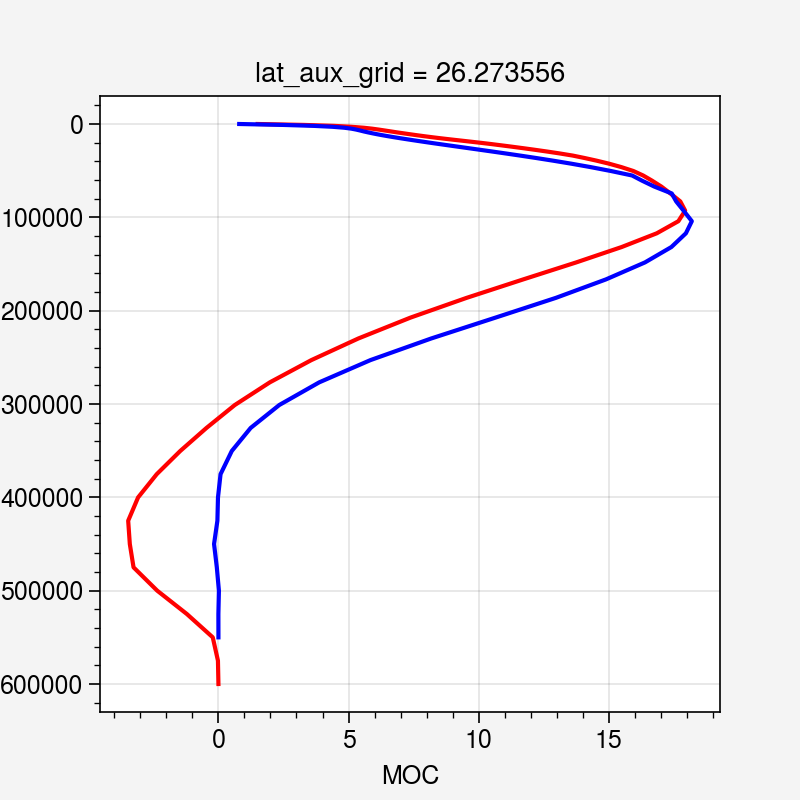

In [33]:
amoc_lat1_tav_TH.plot(color='r',y='moc_z',yincrease=False)
amoc_lat1_tav_TL.plot(color='b',y='moc_z',yincrease=False)
# amoc_lat2_tav_TH.plot(color='r',y='moc_z',yincrease=False)
# amoc_lat2_tav_TL.plot(color='b',y='moc_z',yincrease=False)

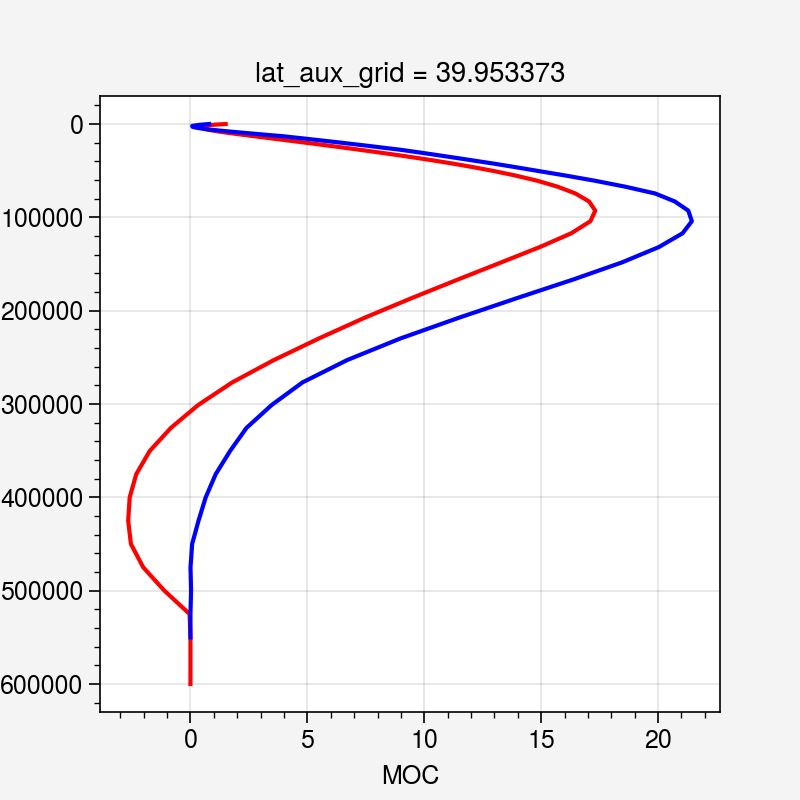

In [31]:
amoc_lat2_tav_TH.plot(color='r',y='moc_z',yincrease=False)
amoc_lat2_tav_TL.plot(color='b',y='moc_z',yincrease=False)

In [85]:
amoc_lat1z1_ts_TL = amoc_lat1_TL.sel(time=slice('1850','2100')).sel(moc_z=1000*100, method='nearest').resample(time='A').mean('time')
amoc_lat1z1_ts_TH = amoc_lat1_TH.sel(time=slice('1850','2100')).sel(moc_z=1000*100, method='nearest').resample(time='A').mean('time')
amoc_lat1z1_ts_CL = amoc_lat1_CL.sel(time=slice('1850','2100')).sel(moc_z=1000*100, method='nearest').resample(time='A').mean('time')
amoc_lat1z1_ts_CH = amoc_lat1_CH.sel(time=slice('1850','2100')).sel(moc_z=1000*100, method='nearest').resample(time='A').mean('time')
amoc_lat1z1_ts_TH

<xarray.DataArray 'MOC' (time: 251)>
array([17.91112  , 16.704172 , 17.358759 , 19.285444 , 18.514196 ,
       20.180569 , 19.913809 , 18.42814  , 18.989283 , 18.622637 ,
       18.888182 , 19.73136  , 17.96741  , 17.692736 , 19.73893  ,
       20.761343 , 21.017935 , 20.86791  , 19.186846 , 19.397753 ,
       20.140776 , 20.293499 , 20.107174 , 17.900183 , 18.07446  ,
       18.072405 , 18.273073 , 18.192842 , 17.166697 , 18.98989  ,
       17.367094 , 18.48976  , 17.269163 , 17.842268 , 16.057016 ,
       17.444735 , 17.493109 , 18.693518 , 19.105309 , 17.68824  ,
       18.984941 , 17.031889 , 17.408703 , 17.897444 , 18.080828 ,
       17.870014 , 18.079971 , 18.074915 , 18.02067  , 17.002102 ,
       18.642641 , 16.040579 , 18.46469  , 18.915892 , 18.767057 ,
       21.958109 , 23.092844 , 19.81558  , 19.420738 , 18.994911 ,
       17.931181 , 18.42571  , 17.666113 , 16.380999 , 17.643103 ,
       18.521973 , 18.876036 , 18.13371  , 18.63348  , 17.481733 ,
       17.204687 , 17.186892 , 18.690012 , 17.974937 , 17.393196 ,
       16.474936 , 16.746826 , 16.429663 , 17.870926 , 16.391275 ,
       17.779818 , 16.979683 , 18.862871 , 17.664925 , 18.093689 ,
       17.486822 , 18.360468 , 20.146154 , 18.491434 , 18.681067 ,
       18.118979 , 17.764242 , 18.732986 , 18.357529 , 18.591951 ,
       17.464506 , 18.47246  , 17.418402 , 18.415297 , 17.566328 ,
...
       17.803534 , 18.743433 , 17.788658 , 18.54837  , 17.697607 ,
       17.955914 , 18.75799  , 18.254066 , 18.149424 , 16.921278 ,
       17.949974 , 17.404016 , 16.25765  , 16.292301 , 16.631704 ,
       17.966774 , 16.252924 , 15.9505415, 16.007093 , 16.256676 ,
       16.049006 , 15.99453  , 16.665379 , 16.504208 , 14.7580595,
       15.864484 , 15.045936 , 17.172813 , 17.20128  , 16.99512  ,
       14.857127 , 15.677036 , 14.910165 , 15.291038 , 15.168681 ,
       13.865849 , 14.351108 , 14.544819 , 13.792683 , 13.594245 ,
       13.106509 , 16.975685 , 14.618491 , 14.1678705, 14.481078 ,
       13.661316 , 12.789375 , 13.118271 , 15.277013 , 14.26365  ,
       14.008395 , 13.636107 , 14.192761 , 14.0836115, 12.454024 ,
       13.854832 , 13.563558 , 12.540845 , 12.353169 , 11.01447  ,
       11.80166  , 13.0009   , 13.919639 , 11.947635 , 12.976584 ,
       13.711999 , 12.127587 , 10.800492 , 11.875554 , 12.326407 ,
       12.055272 , 10.715692 , 12.650674 , 13.343089 , 11.447643 ,
       11.247951 , 10.898362 , 13.194604 , 11.17991  , 10.849677 ,
       11.613545 , 11.355656 , 11.371335 , 10.619622 ,  9.022295 ,
       11.909206 , 10.577344 , 10.468748 , 10.486183 , 10.85587  ,
        9.578611 , 10.750318 ,  8.941472 ,  8.753316 , 10.943195 ,
       10.414016 ], dtype=float32)
Coordinates:
  * time               (time) object 1850-12-31 00:00:00 ... 2100-12-31 00:00:00
    transport_regions  |S256 b'Atlantic Ocean + Mediterranean Sea + Labrador ...
    moc_components     |S256 b'Eulerian Mean'
    moc_z              float32 1.041e+05
    lat_aux_grid       float32 26.27

In [ ]:
amoc_z1_ts_TH = amoc_obs.resample(time='A').mean().sel(depth=1000,method='nearest') # 2005-2019 yr time series

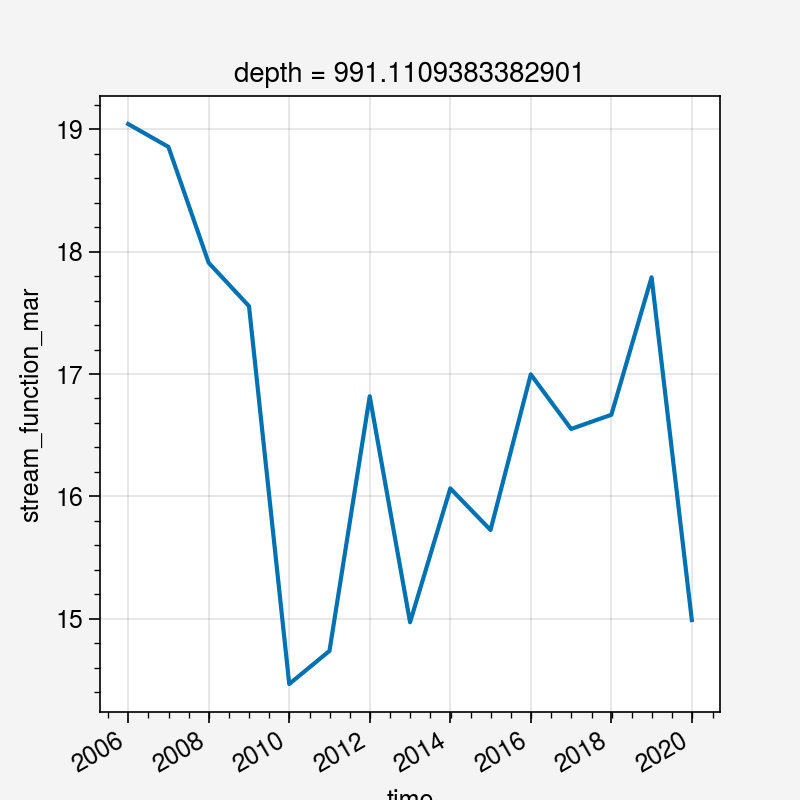

In [61]:
amoc_z1_ts_obs.plot()

In [ ]:
fig1, axs = plt.subplots(2,2,figsize=(12, 8),dpi=500)
# fig, axs = plot.subplots(nrows=3, ncols=2, width='12in', height='10in')

yrs = np.arange(1850,2100+1,1)

# column 1: global av. steric height and SSH
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_fn_TH, color='r', 
#          linewidth=2, label='TR HR')
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_CH, color='r', linestyle='dashed', 
#          linewidth=2, label='CN HR')
axs[0,0].plot(np.arange(1850,2100+1,1), (h_rst_gl_a_TH-h_rst_gl_a_CH), 
         color='r', linewidth=2, label='HR')
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_intp_TL, color='c', 
#          linewidth=2, label='TR LR')
# axs[0,0].plot(np.arange(1850,2100+1,1), h_rst_gl_a_intp_CL, color='c', 
#          linewidth=2, linestyle='dashed',label='CN LR')
axs[0,0].plot(np.arange(1850,2100+1,1), (h_rst_gl_a_TL-h_rst_gl_a_CL), 
         color='b', linewidth=2, label='LR')
axs[0,0].set_xlim([1850,2100])
axs[0,0].set_ylim([-10,40])
axs[0,0].set_ylabel('[cm]', fontsize=15)
axs[0,0].set_title('global mean steric height relative to 1850', fontsize=15)
axs[0,0].grid()
axs[0,0].legend(loc="upper left", frameon=True)
axs[0,0].text(1855, -9, 'a', fontsize=12)
axs[0,0].tick_params(axis='both', which='major', labelsize=12)
axs[0,0].fill_between([2001,2100+1], [-10,-10], [40,40], 
                facecolor='r', alpha=0.1)

axs[0,1].plot(yrs, MOC45_yr_TL, color='b', linewidth=0.5, label="TR LR")
axs[0,1].plot(yrs, MOC45_yr_TL.rolling(time=10, center=True).mean(), color='b', linewidth=2, label="TR LR")
axs[0,1].plot(yrs, MOC45_yr_TH, color='r', linewidth=0.5, label="TR HR")
axs[0,1].plot(yrs, MOC45_yr_TH.rolling(time=10, center=True).mean(), color='r', linewidth=2, label="TR HR")
axs[0,1].set_xlim([1850,2100])
axs[0,1].set_ylim([5,27.5])
axs[0,1].set_ylabel('[Sv]', fontsize=15)
axs[0,1].set_title('AMOC strength (TNST)', fontsize=15)
axs[0,1].grid()
axs[0,1].text(1855, 5.5, 'b', fontsize=12)
axs[0,1].tick_params(axis='both', which='major', labelsize=12)
axs[0,1].fill_between([2001,2100+1], [5,5], [27.5,27.5], 
                facecolor='r', alpha=0.1)

axs[1,0].plot(yrs, MOC45_yr_CL, color='b', linestyle='-', 
            linewidth=0.5, label="CN LR")
axs[1,0].plot(yrs, MOC45_yr_CL.rolling(time=10, center=True).mean(), color='b', linestyle='-', 
            linewidth=2, label="CN LR")
axs[1,0].plot(yrs, MOC45_yr_CH, color='r', linestyle='-', 
            linewidth=0.5, label="CN HR")
axs[1,0].plot(yrs, MOC45_yr_CH.rolling(time=10, center=True).mean(), color='r', linestyle='-', 
            linewidth=2, label="CN HR")
axs[1,0].set_xlim([1850,2100])
axs[1,0].set_ylim([5,27.5])
axs[1,0].set_ylabel('[Sv]', fontsize=15)
axs[1,0].set_title('AMOC strength (CTRL)', fontsize=15)
axs[1,0].grid()
axs[1,0].text(1855, 5.5, 'c', fontsize=12)
axs[1,0].tick_params(axis='both', which='major', labelsize=12)

MOC45_yr_TLmCL = MOC45_yr_TL - MOC45_yr_CL
MOC45_yr_THmCH = MOC45_yr_TH - MOC45_yr_CH
axs[1,1].plot(yrs, MOC45_yr_TLmCL, 
              color='b', linestyle='-', linewidth=0.5, label="CN LR")
axs[1,1].plot(yrs, MOC45_yr_TLmCL.rolling(time=10, center=True).mean(), 
              color='b', linestyle='-', linewidth=2, label="CN LR")
axs[1,1].plot(yrs, MOC45_yr_THmCH, color='r', linestyle='-', 
            linewidth=0.5, label="CN HR")
axs[1,1].plot(yrs, MOC45_yr_THmCH.rolling(time=10, center=True).mean().values, 
              color='r', linestyle='-', 
            linewidth=2, label="CN HR")
axs[1,1].set_xlim([1850,2100])
axs[1,1].set_ylim([-15,7.5])
axs[1,1].set_ylabel('[Sv]', fontsize=15)
axs[1,1].set_title('AMOC strength (TNST - CTRL)', fontsize=15)
axs[1,1].grid()
axs[1,1].text(1855, -14.5, 'd', fontsize=12)
axs[1,1].tick_params(axis='both', which='major', labelsize=12)
axs[1,1].fill_between([2001,2100+1], [-15,-15], [7.5,7.5], 
                facecolor='r', alpha=0.1)

fig1.tight_layout()

fig1.savefig(pic1,bbox_inches='tight')

In [105]:
# fig1, axs = plt.subplots(2,2,figsize=(10,8))
fig1, axs = plt.subplots(2,2,figsize=(12, 8), dpi=500)
axs[0,0].plot(amoc_tav_TH, amoc_tav_TH.moc_z/100, color='r', marker='o', markersize=3)
axs[0,0].plot(amoc_tav_TL, amoc_tav_TL.moc_z/100, color='b', marker='o', markersize=3)
axs[0,0].plot(amoc_tav_obs, amoc_tav_obs.depth, color='k', marker='o', markersize=3)
axs[0,0].invert_yaxis()

axs[0,1].plot(np.arange(1850,2100+1,1), amoc_lat1z1_ts_TH, color='r', marker='o', markersize=3)
axs[0,1].plot(np.arange(1850,2100+1,1), amoc_lat1z1_ts_TL, color='b', marker='o', markersize=3)
axs[0,1].plot(np.arange(2005,2019+1,1), amoc_z1_ts_obs, color='k', marker='o', markersize=3)
l, b, h, w = .58, .565, .1, .2
axs2 = fig1.add_axes([l, b, w, h])
axs2.plot(np.arange(2005,2019+1,1), amoc_lat1z1_ts_TH.sel(time=slice('2005','2019')), color='r', marker='o', markersize=3)
axs2.plot(np.arange(2005,2019+1,1), amoc_lat1z1_ts_TL.sel(time=slice('2005','2019')), color='b', marker='o', markersize=3)
axs2.plot(np.arange(2005,2019+1,1), amoc_z1_ts_obs, color='k', marker='o', markersize=3)
axs[1,0].plot(np.arange(1850,2100+1,1), amoc_lat1z1_ts_CH.sel(time=slice('1850','2100')), color='r', marker='o', markersize=3)
axs[1,0].plot(np.arange(1850,2100+1,1), amoc_lat1z1_ts_CL.sel(time=slice('1850','2100')), color='b', marker='o', markersize=3)

axs[1,1].plot(np.arange(1850,2100+1,1), amoc_lat1z1_ts_TH-amoc_lat1z1_ts_CH, color='r', marker='o', markersize=3)
axs[1,1].plot(np.arange(1850,2100+1,1), amoc_lat1z1_ts_TL-amoc_lat1z1_ts_CL, color='b', marker='o', markersize=3)

fig1.tight_layout()

# fig1.savefig(pic1,bbox_inches='tight')

axs[1,1].plot(yrs, MOC45_yr_THmCH.rolling(time=10, center=True).mean().values, 
              color='r', linestyle='-', 
            linewidth=2, label="CN HR")
axs[1,1].set_xlim([1850,2100])
axs[1,1].set_ylim([-15,7.5])
axs[1,1].set_ylabel('[Sv]', fontsize=15)
axs[1,1].set_title('AMOC strength (TNST - CTRL)', fontsize=15)
axs[1,1].grid()
axs[1,1].text(1855, -14.5, 'd', fontsize=12)
axs[1,1].tick_params(axis='both', which='major', labelsize=12)
axs[1,1].fill_between([2001,2100+1], [-15,-15], [7.5,7.5], 
                facecolor='r', alpha=0.1)

fig1.tight_layout()

fig1.savefig(pic1,bbox_inches='tight')

/ihesp/software/conda/envs/xroms_unstable_daskpr/lib/python3.7/site-packages/ipykernel_launcher.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


In [90]:
print(amoc_lat1z1_ts_CH.sel(time=slice('1850','2100')).mean('time').values)
print(amoc_lat1z1_ts_CL.sel(time=slice('1850','2100')).mean('time').values)

17.762344
18.824095


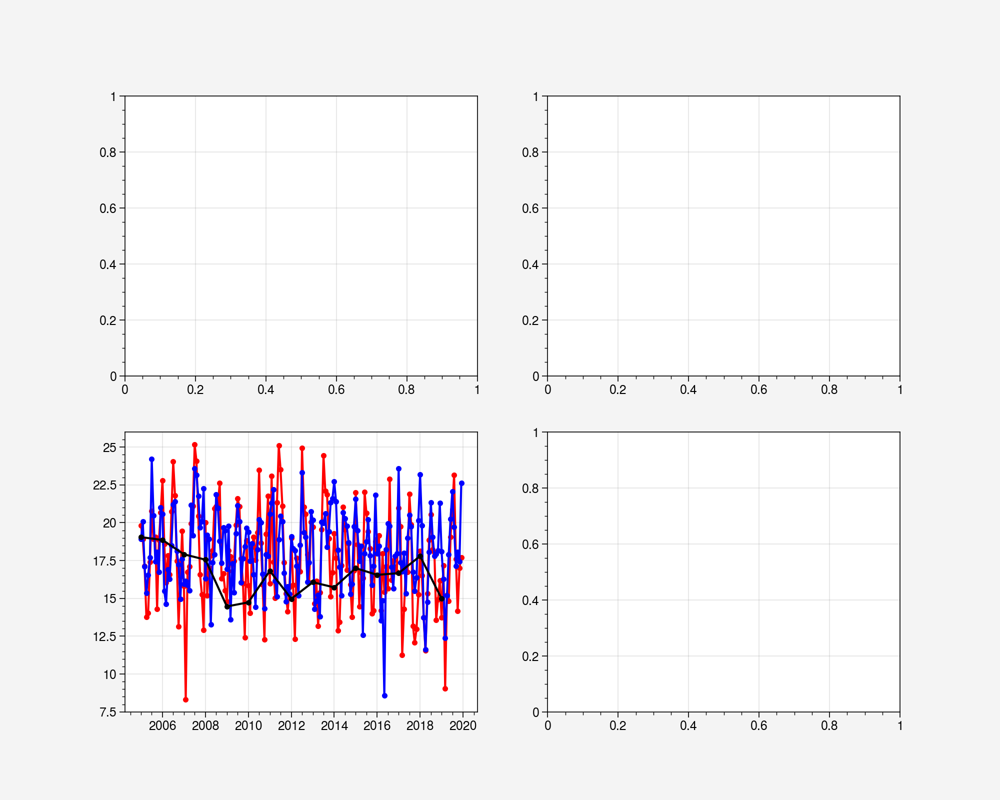

In [83]:
fig, axs = plt.subplots(2,2,figsize=(10,8))
axs[1,0].plot(np.arange(2005,2019+1,1/12), amoc_lat1z1_ts_TH.sel(time=slice('2005','2019')), color='r', marker='o', markersize=3)
axs[1,0].plot(np.arange(2005,2019+1,1/12), amoc_lat1z1_ts_TL.sel(time=slice('2005','2019')), color='b', marker='o', markersize=3)
axs[1,0].plot(np.arange(2005,2019+1,1), amoc_z1_ts_obs, color='k', marker='o', markersize=3)

In [38]:
A_TL = ds_MOC_TL.MOC.sel(lat_aux_grid=26.5, method='nearest').sel(moc_comp=0, transport_reg=1, time=slice('1850','2100'))
A_TH = ds_MOC_TH.MOC.sel(lat_aux_grid=26.5, method='nearest').sel(moc_comp=0, transport_reg=1, time=slice('1850','2100'))
A_TH

<xarray.DataArray 'MOC' (time: 3012, moc_z: 63)>
[189756 values with dtype=float32]
Coordinates:
  * time               (time) object 1850-01-31 00:00:00 ... 2100-12-31 00:00:00
    transport_regions  |S256 b'Atlantic Ocean + Mediterranean Sea + Labrador ...
    moc_components     |S256 b'Eulerian Mean'
  * moc_z              (moc_z) float32 0.0 1e+03 2e+03 ... 5.75e+05 6e+05
    lat_aux_grid       float32 26.27
Attributes:
    units:      Sverdrups
    long_name:  Meridional Overturning Circulation

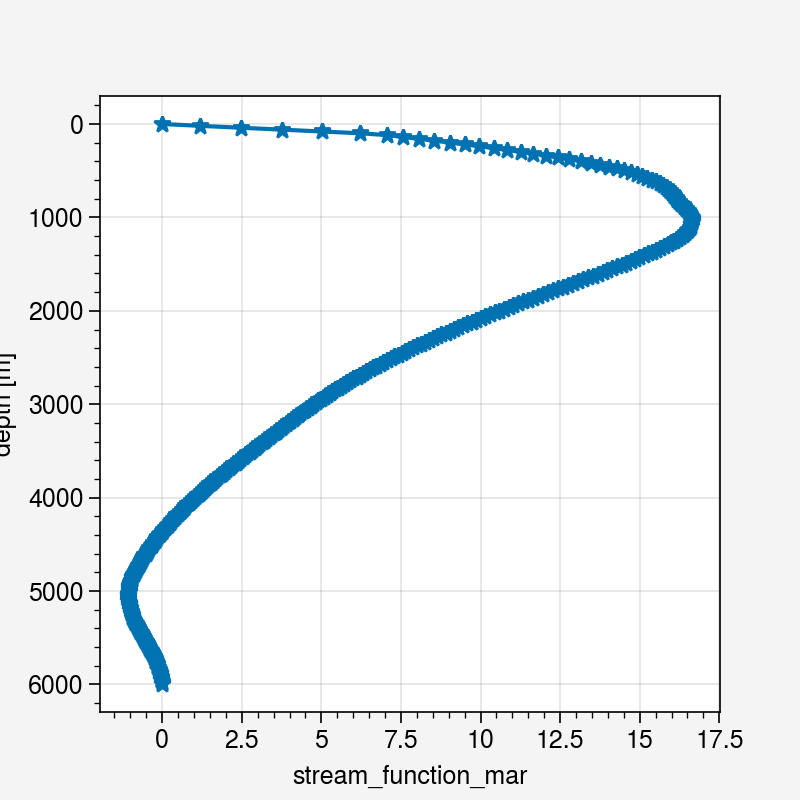

In [27]:
moc_z_obs.mean('time').plot(y='depth',yincrease=False,marker='*')

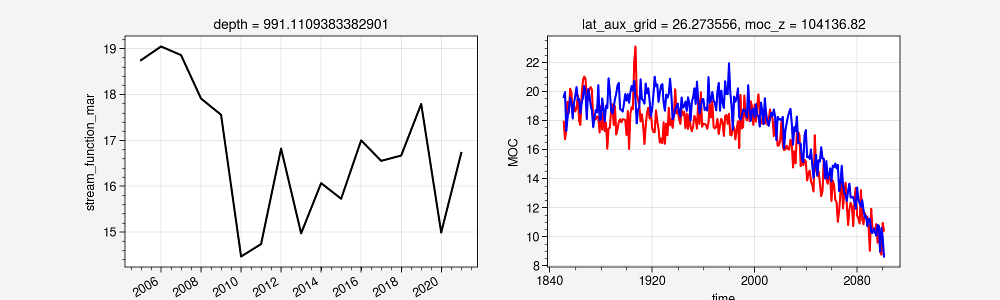

In [34]:
fig, axs = plt.subplots(1,2,figsize=(10,3))
ds_moc_z_obs.stream_function_mar.sel(depth=1000, method='nearest').resample(time='A').mean().plot(ax=axs[0],color='k')
MOC45_yr_TH.plot(ax=axs[1],color='r')
MOC45_yr_TL.plot(ax=axs[1],color='b')

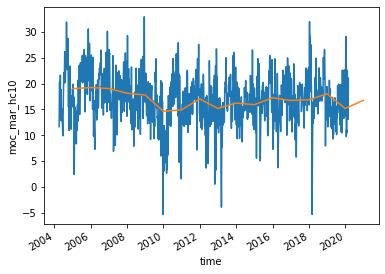

In [25]:
ds_moc_t_obs.moc_mar_hc10.plot()
ds_moc_t_obs.moc_mar_hc10.resample(time='A').mean().plot()

In [19]:
print(ds_MOC_TH.MOC.dims)
print(ds_MOC_TH.MOC.transport_reg)#moc_comp.values

('time', 'transport_reg', 'moc_comp', 'moc_z', 'lat_aux_grid')
<xarray.DataArray 'transport_reg' (transport_reg: 2)>
array([0, 1])
Coordinates:
    transport_regions  (transport_reg) |S256 b'Global Ocean - Marginal Seas' ...
Dimensions without coordinates: transport_reg


In [ ]:
moc_TH = ds_MOC_TH.MOC.sel(lat_aux_grid=26.5, moc_z=1000*100,
         method='nearest').sel(moc_comp=0, transport_reg=1, time=slice('1850','2100')).resample(time='A').mean('time'))

In [32]:
MOC45_yr_TL = (ds_MOC_TL.MOC.sel(lat_aux_grid=26.5, moc_z=1000*100,
    method='nearest').sel(moc_comp=0, transport_reg=1, time=slice('1850','2100')).resample(time='A').mean('time'))
MOC45_yr_TH = (ds_MOC_TH.MOC.sel(lat_aux_grid=26.5, moc_z=1000*100,
    method='nearest').sel(moc_comp=0, transport_reg=1, time=slice('1850','2100')).resample(time='A').mean('time'))
MOC45_yr_TH

<xarray.DataArray 'MOC' (time: 251)>
dask.array<stack, shape=(251,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * time               (time) object 1850-12-31 00:00:00 ... 2100-12-31 00:00:00
    transport_regions  |S256 dask.array<chunksize=(), meta=np.ndarray>
    moc_components     |S256 dask.array<chunksize=(), meta=np.ndarray>
    moc_z              float32 1.041e+05
    lat_aux_grid       float32 26.27

In [33]:
MOC45_yr_CL = (ds_MOC_CL.MOC.sel(lat_aux_grid=26.5, moc_z=1000*100, method='nearest').sel(
    moc_comp=0, transport_reg=1).sel(time=slice('1850','2100')).resample(time='A').mean('time'))
MOC45_yr_CH = (ds_MOC_CH.MOC.sel(lat_aux_grid=26.5, moc_z=1000*100, method='nearest').sel(
    moc_comp=0, transport_reg=1).sel(time=slice('1850','2100')).resample(time='A').mean('time'))
MOC45_yr_CH

<xarray.DataArray 'MOC' (time: 251)>
dask.array<stack, shape=(251,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * time               (time) object 1850-12-31 00:00:00 ... 2100-12-31 00:00:00
    transport_regions  |S256 dask.array<chunksize=(), meta=np.ndarray>
    moc_components     |S256 dask.array<chunksize=(), meta=np.ndarray>
    moc_z              float32 1.041e+05
    lat_aux_grid       float32 26.27

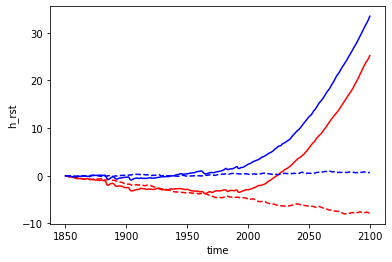

In [13]:
# h_rst_gl_av_TH = ds_hst_TH.h_rst.weighted(ds_t12.TAREA).mean(("nlon", "nlat")).compute()
# h_rst_gl_av_CH = ds_hst_CH.h_rst.weighted(ds_t12.TAREA).mean(("nlon", "nlat")).compute()
# h_rst_gl_av_TL = ds_hst_TL.h_rst.weighted(ds_g16.TAREA).mean(("nlon", "nlat")).compute()
# h_rst_gl_av_CL = ds_hst_CL.h_rst.weighted(ds_g16.TAREA).mean(("nlon", "nlat")).compute()

# h_rst_gl_a_TH = h_rst_gl_av_TH - h_rst_gl_av_TH.isel(time=0) # a: anomaly
# # h_rst_gl_a_TH = h_rst_gl_a_TH.where(h_rst_gl_a_TH<50, np.nan) # mask spikes as nan
# # h_rst_gl_a_TH = h_rst_gl_a_TH.interpolate_na(dim="time", method="linear") # fn: fill nan
# # fill nan with linear interpolation 
# h_rst_gl_a_CH = h_rst_gl_av_CH - h_rst_gl_av_CH.isel(time=0)
# h_rst_gl_a_TL = h_rst_gl_av_TL - h_rst_gl_av_TL.isel(time=0) # a: anomaly
# h_rst_gl_a_CL = h_rst_gl_av_CL - h_rst_gl_av_CL.isel(time=0) # a: anomaly

# h_rst_gl_a_TH.plot(color='r')
# h_rst_gl_a_CH.plot(color='r',linestyle='dashed')
# h_rst_gl_a_TL.plot(color='b')
# h_rst_gl_a_CL.plot(color='b',linestyle='dashed')

# make pics

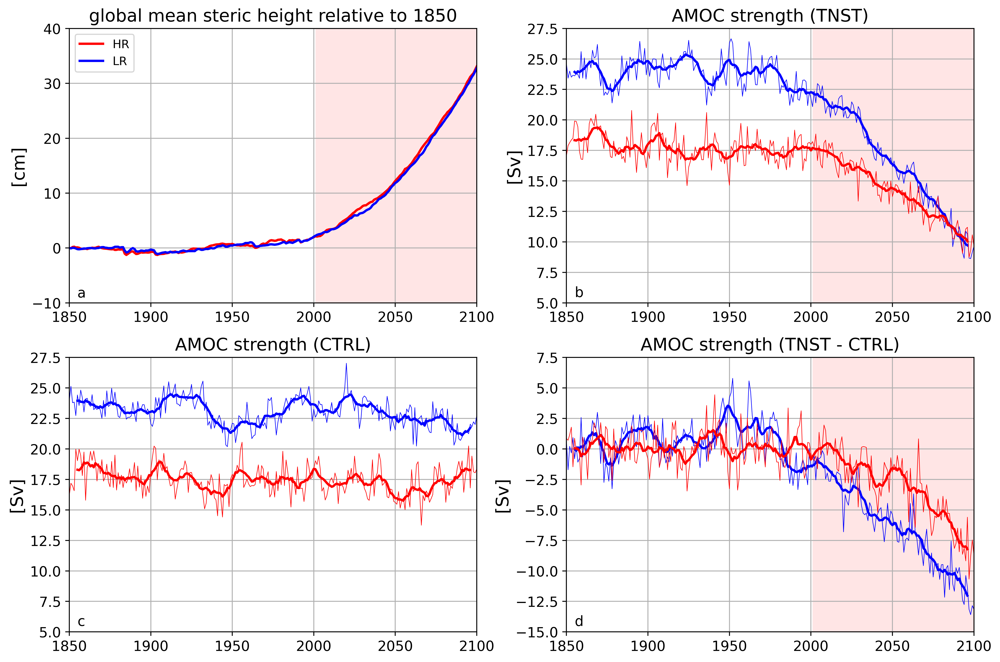

In [14]:
fig1, axs = plt.subplots(2,2,figsize=(12, 8),dpi=500)
# fig, axs = plot.subplots(nrows=3, ncols=2, width='12in', height='10in')

yrs = np.arange(1850,2100+1,1)

# column 1: global av. steric height and SSH
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_fn_TH, color='r', 
#          linewidth=2, label='TR HR')
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_CH, color='r', linestyle='dashed', 
#          linewidth=2, label='CN HR')
axs[0,0].plot(np.arange(1850,2100+1,1), (h_rst_gl_a_TH-h_rst_gl_a_CH), 
         color='r', linewidth=2, label='HR')
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_intp_TL, color='c', 
#          linewidth=2, label='TR LR')
# axs[0,0].plot(np.arange(1850,2100+1,1), h_rst_gl_a_intp_CL, color='c', 
#          linewidth=2, linestyle='dashed',label='CN LR')
axs[0,0].plot(np.arange(1850,2100+1,1), (h_rst_gl_a_TL-h_rst_gl_a_CL), 
         color='b', linewidth=2, label='LR')
axs[0,0].set_xlim([1850,2100])
axs[0,0].set_ylim([-10,40])
axs[0,0].set_ylabel('[cm]', fontsize=15)
axs[0,0].set_title('global mean steric height relative to 1850', fontsize=15)
axs[0,0].grid()
axs[0,0].legend(loc="upper left", frameon=True)
axs[0,0].text(1855, -9, 'a', fontsize=12)
axs[0,0].tick_params(axis='both', which='major', labelsize=12)
axs[0,0].fill_between([2001,2100+1], [-10,-10], [40,40], 
                facecolor='r', alpha=0.1)

axs[0,1].plot(yrs, MOC45_yr_TL, color='b', linewidth=0.5, label="TR LR")
axs[0,1].plot(yrs, MOC45_yr_TL.rolling(time=10, center=True).mean(), color='b', linewidth=2, label="TR LR")
axs[0,1].plot(yrs, MOC45_yr_TH, color='r', linewidth=0.5, label="TR HR")
axs[0,1].plot(yrs, MOC45_yr_TH.rolling(time=10, center=True).mean(), color='r', linewidth=2, label="TR HR")
axs[0,1].set_xlim([1850,2100])
axs[0,1].set_ylim([5,27.5])
axs[0,1].set_ylabel('[Sv]', fontsize=15)
axs[0,1].set_title('AMOC strength (TNST)', fontsize=15)
axs[0,1].grid()
axs[0,1].text(1855, 5.5, 'b', fontsize=12)
axs[0,1].tick_params(axis='both', which='major', labelsize=12)
axs[0,1].fill_between([2001,2100+1], [5,5], [27.5,27.5], 
                facecolor='r', alpha=0.1)

axs[1,0].plot(yrs, MOC45_yr_CL, color='b', linestyle='-', 
            linewidth=0.5, label="CN LR")
axs[1,0].plot(yrs, MOC45_yr_CL.rolling(time=10, center=True).mean(), color='b', linestyle='-', 
            linewidth=2, label="CN LR")
axs[1,0].plot(yrs, MOC45_yr_CH, color='r', linestyle='-', 
            linewidth=0.5, label="CN HR")
axs[1,0].plot(yrs, MOC45_yr_CH.rolling(time=10, center=True).mean(), color='r', linestyle='-', 
            linewidth=2, label="CN HR")
axs[1,0].set_xlim([1850,2100])
axs[1,0].set_ylim([5,27.5])
axs[1,0].set_ylabel('[Sv]', fontsize=15)
axs[1,0].set_title('AMOC strength (CTRL)', fontsize=15)
axs[1,0].grid()
axs[1,0].text(1855, 5.5, 'c', fontsize=12)
axs[1,0].tick_params(axis='both', which='major', labelsize=12)

MOC45_yr_TLmCL = MOC45_yr_TL - MOC45_yr_CL
MOC45_yr_THmCH = MOC45_yr_TH - MOC45_yr_CH
axs[1,1].plot(yrs, MOC45_yr_TLmCL, 
              color='b', linestyle='-', linewidth=0.5, label="CN LR")
axs[1,1].plot(yrs, MOC45_yr_TLmCL.rolling(time=10, center=True).mean(), 
              color='b', linestyle='-', linewidth=2, label="CN LR")
axs[1,1].plot(yrs, MOC45_yr_THmCH, color='r', linestyle='-', 
            linewidth=0.5, label="CN HR")
axs[1,1].plot(yrs, MOC45_yr_THmCH.rolling(time=10, center=True).mean().values, 
              color='r', linestyle='-', 
            linewidth=2, label="CN HR")
axs[1,1].set_xlim([1850,2100])
axs[1,1].set_ylim([-15,7.5])
axs[1,1].set_ylabel('[Sv]', fontsize=15)
axs[1,1].set_title('AMOC strength (TNST - CTRL)', fontsize=15)
axs[1,1].grid()
axs[1,1].text(1855, -14.5, 'd', fontsize=12)
axs[1,1].tick_params(axis='both', which='major', labelsize=12)
axs[1,1].fill_between([2001,2100+1], [-15,-15], [7.5,7.5], 
                facecolor='r', alpha=0.1)

fig1.tight_layout()

fig1.savefig(pic1,bbox_inches='tight')

# Appendix

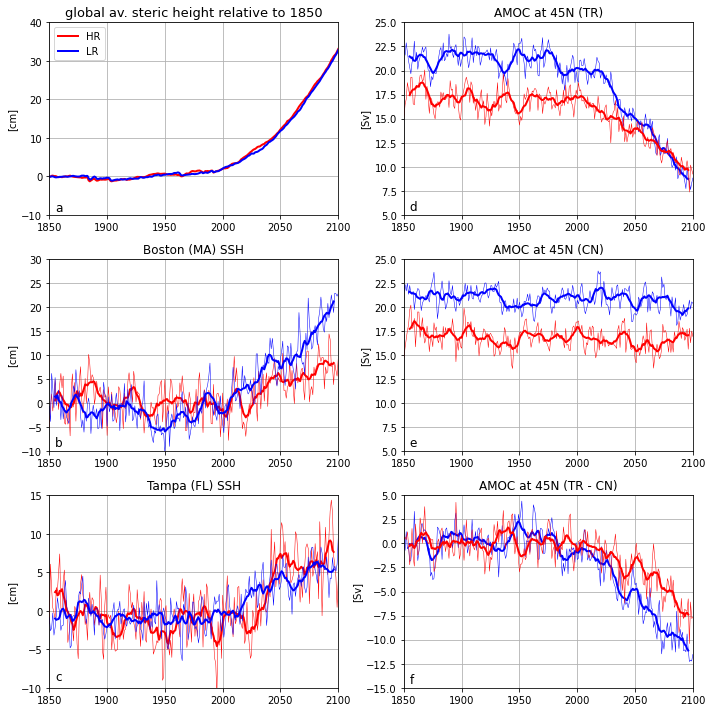

In [28]:
fig1, axs = plt.subplots(3,2,figsize=(10, 10))
# fig, axs = plot.subplots(nrows=3, ncols=2, width='12in', height='10in')

yrs = np.arange(1850,2100+1,1)

# column 1: global av. steric height and SSH
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_fn_TH, color='r', 
#          linewidth=2, label='TR HR')
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_CH, color='r', linestyle='dashed', 
#          linewidth=2, label='CN HR')
axs[0,0].plot(np.arange(1850,2100+1,1), (h_rst_gl_a_fn_TH.values-h_rst_gl_a_CH.values), 
         color='r', linewidth=2, label='HR')
# axs.plot(np.arange(1850,2100+1,1), h_rst_gl_a_intp_TL, color='c', 
#          linewidth=2, label='TR LR')
# axs[0,0].plot(np.arange(1850,2100+1,1), h_rst_gl_a_intp_CL, color='c', 
#          linewidth=2, linestyle='dashed',label='CN LR')
axs[0,0].plot(np.arange(1850,2100+1,1), (h_rst_gl_a_intp_TL-h_rst_gl_a_intp_CL), 
         color='b', linewidth=2, label='LR')
axs[0,0].set_xlim([1850,2100])
axs[0,0].set_ylim([-10,40])
axs[0,0].set_ylabel('[cm]')
axs[0,0].set_title('global av. steric height relative to 1850', fontsize=13)
axs[0,0].grid()
axs[0,0].legend(loc="upper left", frameon=True)
axs[0,0].text(1855, -9, 'a', fontsize=12)

ssh_yrB_THmCH = ssh_yr_TH.isel(nlon_t=0,nlat_t=0) - ssh_yr_CH.isel(nlon_t=0,nlat_t=0) # B: Boston
ssh_yrB_TLmCL = ssh_yr_TL.isel(nlon_t=0,nlat_t=0) - ssh_yr_CL.isel(nlon_t=0,nlat_t=0)
axs[1,0].plot(yrs, ssh_yrB_THmCH, color='r', 
            linewidth=0.5, linestyle='-',label="HR")
axs[1,0].plot(yrs, ssh_yrB_THmCH.rolling(time=10, center=True).mean(), color='r', 
            linewidth=2, linestyle='-',label="HR")
axs[1,0].plot(yrs, ssh_yrB_TLmCL, color='b', 
            linewidth=0.5, linestyle='-',label="LR")
axs[1,0].plot(yrs, ssh_yrB_TLmCL.rolling(time=10, center=True).mean(), color='b', 
            linewidth=2, linestyle='-',label="LR")
axs[1,0].set_xlim([1850,2100])
axs[1,0].set_ylim([-10,30])
axs[1,0].set_ylabel('[cm]')
axs[1,0].set_title('Boston (MA) SSH')
axs[1,0].grid()
axs[1,0].text(1855, -9, 'b', fontsize=12)

ssh_yrT_THmCH = ssh_yr_TH.isel(nlon_t=1,nlat_t=1) - ssh_yr_CH.isel(nlon_t=1,nlat_t=1) # T: Tampa
ssh_yrT_TLmCL = ssh_yr_TL.isel(nlon_t=1,nlat_t=1) - ssh_yr_CL.isel(nlon_t=1,nlat_t=1)
axs[2,0].plot(yrs, ssh_yrT_THmCH, color='r', 
            linewidth=0.5, linestyle='-',label="HR")
axs[2,0].plot(yrs, ssh_yrT_THmCH.rolling(time=10, center=True).mean(), color='r', 
            linewidth=2, linestyle='-',label="HR")
axs[2,0].plot(yrs, ssh_yrT_TLmCL, color='b', 
            linewidth=0.5, linestyle='-',label="LR")
axs[2,0].plot(yrs, ssh_yrT_TLmCL.rolling(time=10, center=True).mean(), color='b', 
            linewidth=2, linestyle='-',label="LR")
axs[2,0].set_xlim([1850,2100])
axs[2,0].set_ylim([-10,15])
axs[2,0].set_ylabel('[cm]')
axs[2,0].set_title('Tampa (FL) SSH')
axs[2,0].grid()
axs[2,0].text(1855, -9, 'c', fontsize=12)

# column 2: AMOC
axs[0,1].plot(yrs, MOC45_yr_TL, color='b', linewidth=0.5, label="TR LR")
axs[0,1].plot(yrs, MOC45_yr_TL.rolling(time=10, center=True).mean(), color='b', linewidth=2, label="TR LR")
axs[0,1].plot(yrs, MOC45_yr_TH, color='r', linewidth=0.5, label="TR HR")
axs[0,1].plot(yrs, MOC45_yr_TH.rolling(time=10, center=True).mean(), color='r', linewidth=2, label="TR HR")
axs[0,1].set_xlim([1850,2100])
axs[0,1].set_ylim([5,25])
axs[0,1].set_ylabel('[Sv]')
axs[0,1].set_title('AMOC at 45N (TR)')
axs[0,1].grid()
axs[0,1].text(1855, 5.5, 'd', fontsize=12)

axs[1,1].plot(yrs, MOC45_yr_CL, color='b', linestyle='-', 
            linewidth=0.5, label="CN LR")
axs[1,1].plot(yrs, MOC45_yr_CL.rolling(time=10, center=True).mean(), color='b', linestyle='-', 
            linewidth=2, label="CN LR")
axs[1,1].plot(yrs, MOC45_yr_CH, color='r', linestyle='-', 
            linewidth=0.5, label="CN HR")
axs[1,1].plot(yrs, MOC45_yr_CH.rolling(time=10, center=True).mean(), color='r', linestyle='-', 
            linewidth=2, label="CN HR")
axs[1,1].set_xlim([1850,2100])
axs[1,1].set_ylim([5,25])
axs[1,1].set_ylabel('[Sv]')
axs[1,1].set_title('AMOC at 45N (CN)')
axs[1,1].grid()
axs[1,1].text(1855, 5.5, 'e', fontsize=12)

MOC45_yr_TLmCL = MOC45_yr_TL - MOC45_yr_CL
MOC45_yr_THmCH = MOC45_yr_TH - MOC45_yr_CH
axs[2,1].plot(yrs, MOC45_yr_TLmCL, 
              color='b', linestyle='-', linewidth=0.5, label="CN LR")
axs[2,1].plot(yrs, MOC45_yr_TLmCL.rolling(time=10, center=True).mean(), 
              color='b', linestyle='-', linewidth=2, label="CN LR")
axs[2,1].plot(yrs, MOC45_yr_THmCH, color='r', linestyle='-', 
            linewidth=0.5, label="CN HR")
axs[2,1].plot(yrs, MOC45_yr_THmCH.rolling(time=10, center=True).mean().values, 
              color='r', linestyle='-', 
            linewidth=2, label="CN HR")
axs[2,1].set_xlim([1850,2100])
axs[2,1].set_ylim([-15,5])
axs[2,1].set_ylabel('[Sv]')
axs[2,1].set_title('AMOC at 45N (TR - CN)')
axs[2,1].grid()
axs[2,1].text(1855, -14.5, 'f', fontsize=12)

fig1.tight_layout()

fig1.savefig(pic1,bbox_inches='tight')

compute regression statistics

In [22]:
# # Boston
# pfB_TH = np.polyfit(MOC45_yr_TH.sel(time=slice('2000','2100')), 
#                     ssh_yr_TH.isel(nlon_t=0, nlat_t=0).sel(time=slice('2000','2100')), deg=1) # pf: polyfit, B: Boston
# pfB_TL = np.polyfit(MOC45_yr_TL.sel(time=slice('2000','2100')), 
#                     ssh_yr_TL.isel(nlon_t=0, nlat_t=0).sel(time=slice('2000','2100')), deg=1)

# print('Boston, SSH2AMOC(TH):', pfB_TH[0])
# print('Boston, SSH2AMOC(TL):', pfB_TL[0])

# # New York
# pfN_TH = np.polyfit(MOC45_yr_TH.sel(time=slice('2000','2100')), 
#                     ssh_yr_TH.isel(nlon_t=1, nlat_t=1).sel(time=slice('2000','2100')), deg=1)# pf: polyfit, N: New York
# pfN_TL = np.polyfit(MOC45_yr_TL.sel(time=slice('2000','2100')), 
#                     ssh_yr_TL.isel(nlon_t=1, nlat_t=1).sel(time=slice('2000','2100')), deg=1)
# print('New York, SSH2AMOC(TH):', pfN_TH[0])
# print('New York, SSH2AMOC(TL):', pfN_TL[0])

Boston, SSH2AMOC(TH): -1.1575294817509472
Boston, SSH2AMOC(TL): -1.732173291130704
New York, SSH2AMOC(TH): -0.9538831050745664
New York, SSH2AMOC(TL): -1.480499361030324


In [23]:
# 1.7/1.2, 1.5/1

(1.4166666666666667, 1.5)